## airline passenger satisfaction

In [1]:
#Importing libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O 

import os

import warnings
warnings.filterwarnings("ignore")

################# visualization #################
import matplotlib.pyplot as plt 
from PIL import  Image
import seaborn as sns 
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

In [2]:
airline=pd.read_csv(r"C:\Users\Sourabh\Downloads\archive (26)\train.csv")

In [3]:
airline

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,103899,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,...,2,3,1,4,2,3,2,3,0.0,neutral or dissatisfied
103900,103900,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,...,5,5,5,5,5,5,4,0,0.0,satisfied
103901,103901,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,...,4,3,2,4,5,5,4,7,14.0,neutral or dissatisfied
103902,103902,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,...,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied


##### checking the weightage of sub types in category variables

In [4]:
airline['Customer Type'].value_counts()

Loyal Customer       84923
disloyal Customer    18981
Name: Customer Type, dtype: int64

In [5]:
airline['Type of Travel'].value_counts()

Business travel    71655
Personal Travel    32249
Name: Type of Travel, dtype: int64

In [6]:
airline['Class'].value_counts()

Business    49665
Eco         46745
Eco Plus     7494
Name: Class, dtype: int64

In [7]:
airline.columns

Index(['Unnamed: 0', 'id', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')

#### dropping unwanted columns

In [9]:
airline.drop(columns=['Unnamed: 0', 'id'],axis=1,inplace=True)

In [10]:
airline['satisfaction'].value_counts()

neutral or dissatisfied    58879
satisfied                  45025
Name: satisfaction, dtype: int64

In [11]:
airline['satisfaction'].replace({'neutral or dissatisfied':'dissatisfied'},inplace=True)

In [12]:
pd.set_option('display.max_columns',25)

In [13]:
airline['Seat comfort'].value_counts()

4    31765
5    26470
3    18696
2    14897
1    12075
0        1
Name: Seat comfort, dtype: int64

#### visual representation of categorical data

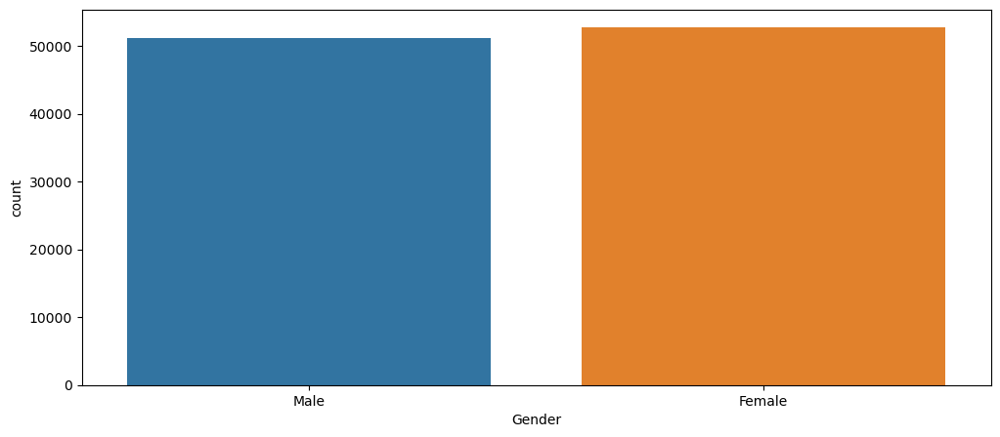

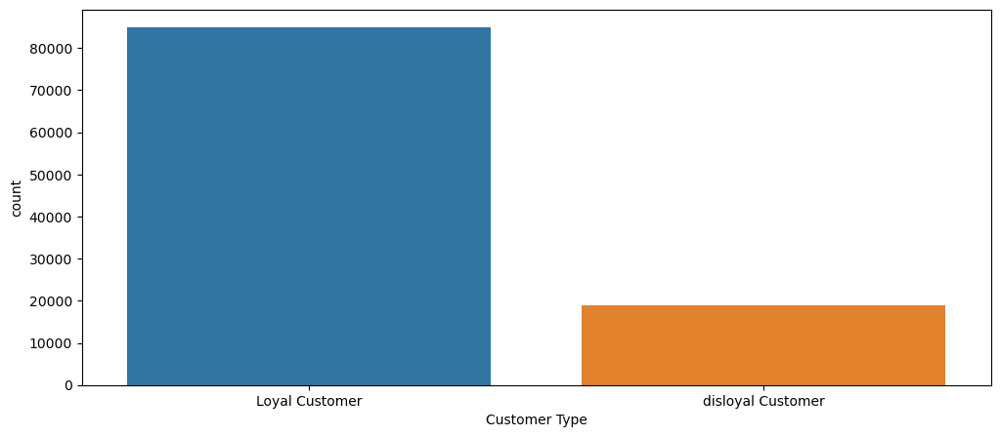

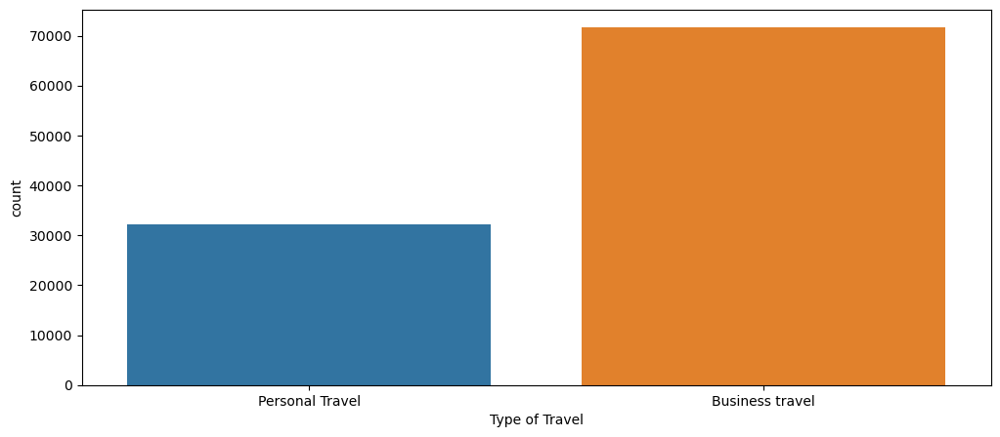

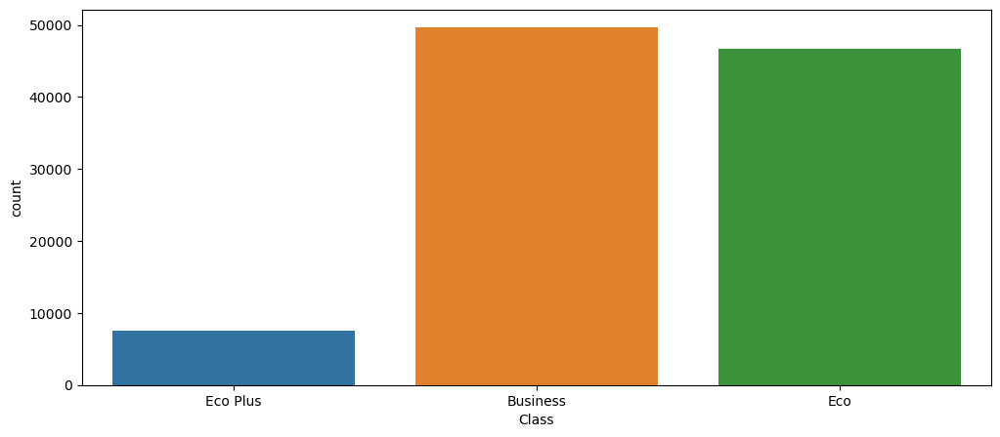

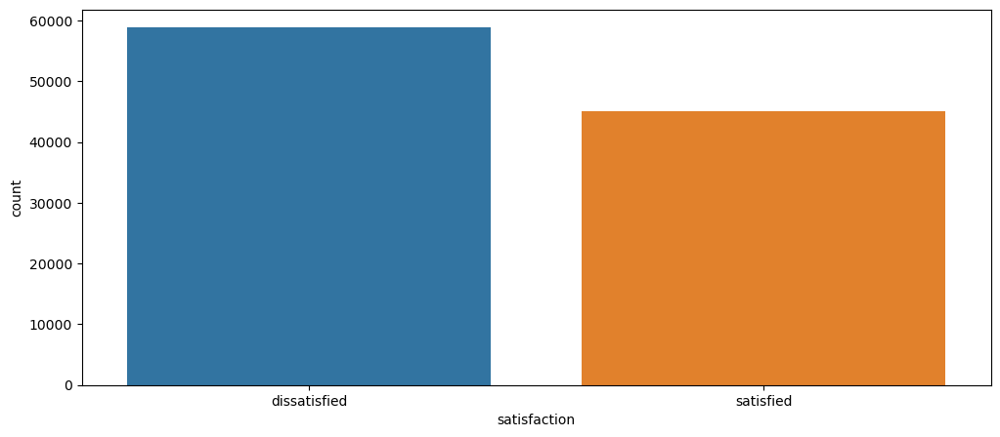

In [14]:
import matplotlib.pyplot as plt 
for column in airline.select_dtypes(include='object'):
    plt.figure(figsize=(12, 5))  
    sns.countplot(x=column, data=airline)

In [15]:
for i in ['Gender', 'Customer Type','Type of Travel','Class']:
    print(airline[i].value_counts())

Female    52727
Male      51177
Name: Gender, dtype: int64
Loyal Customer       84923
disloyal Customer    18981
Name: Customer Type, dtype: int64
Business travel    71655
Personal Travel    32249
Name: Type of Travel, dtype: int64
Business    49665
Eco         46745
Eco Plus     7494
Name: Class, dtype: int64


In [16]:
airline.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  object 
 1   Customer Type                      103904 non-null  object 
 2   Age                                103904 non-null  int64  
 3   Type of Travel                     103904 non-null  object 
 4   Class                              103904 non-null  object 
 5   Flight Distance                    103904 non-null  int64  
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding                    1039

#### checking nan's

In [17]:
airline.isna().sum()

Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure Delay in Minutes             0
Arrival Delay in Minutes             310
satisfaction                           0
dtype: int64

#### handling outliers

<Axes: >

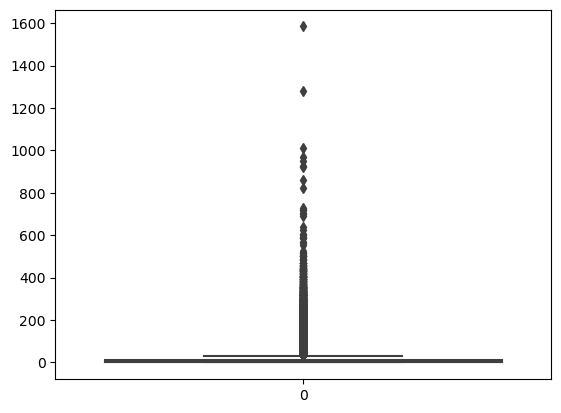

In [18]:
sns.boxplot(data=airline['Arrival Delay in Minutes'])

#### filling out nan values 

In [19]:
airline['Arrival Delay in Minutes'].fillna(airline['Arrival Delay in Minutes'].median(),inplace = True)

In [20]:
airline.isna().sum()

Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
satisfaction                         0
dtype: int64

In [21]:
for i in ['Age','Flight Distance','Departure Delay in Minutes','Arrival Delay in Minutes']:                  
    if airline[i].dtypes in ("float64","int64"):
        q1 = airline[i].quantile(0.25) 
        q3 = airline[i].quantile(0.75)  
        iqr = q3-q1 
        ul = q3 + 1.5*iqr       
        ll = q1 - 1.5*iqr 
        airline[i].clip(upper=ul,lower=ll,inplace=True)

In [22]:
airline

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460.0,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235.0,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,dissatisfied
2,Female,Loyal Customer,26,Business travel,Business,1142.0,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,Female,Loyal Customer,25,Business travel,Business,562.0,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,dissatisfied
4,Male,Loyal Customer,61,Business travel,Business,214.0,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,Female,disloyal Customer,23,Business travel,Eco,192.0,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,dissatisfied
103900,Male,Loyal Customer,49,Business travel,Business,2347.0,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0.0,satisfied
103901,Male,disloyal Customer,30,Business travel,Business,1995.0,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0,dissatisfied
103902,Female,disloyal Customer,22,Business travel,Eco,1000.0,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0,dissatisfied


#### piechart to see the proportion of satisfied and dissatisfied customers

In [23]:
import plotly.express as px

fig = px.pie(airline,names='satisfaction',color='satisfaction',
             color_discrete_map={'dissatisfied':'red','satisfied':'green'})
fig.show()

### analysis for finding factors affecting dissatisfied customers

In [118]:
disstisfied= airline[airline["satisfaction"] == "dissatisfied"]  

disstisfied

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460.0,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235.0,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,dissatisfied
3,Female,Loyal Customer,25,Business travel,Business,562.0,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,dissatisfied
5,Female,Loyal Customer,26,Personal Travel,Eco,1180.0,3,4,2,1,1,2,1,1,3,4,4,4,4,1,0,0.0,dissatisfied
6,Male,Loyal Customer,47,Personal Travel,Eco,1276.0,2,4,2,3,2,2,2,2,3,3,4,3,5,2,9,23.0,dissatisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103898,Male,Loyal Customer,50,Personal Travel,Eco,1620.0,3,1,3,4,2,3,2,2,4,3,4,2,4,2,0,0.0,dissatisfied
103899,Female,disloyal Customer,23,Business travel,Eco,192.0,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,dissatisfied
103901,Male,disloyal Customer,30,Business travel,Business,1995.0,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0,dissatisfied
103902,Female,disloyal Customer,22,Business travel,Eco,1000.0,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0,dissatisfied


In [124]:
disstisfied.columns

Index(['Gender', 'Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')

In [127]:
list1=[]
for i in ['Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness']:
    list1.append((i,disstisfied[i].mean()))

In [128]:
list1

[('Inflight wifi service', 2.3996331459433753),
 ('Departure/Arrival time convenient', 3.1291122471509367),
 ('Ease of Online booking', 2.5468503201481005),
 ('Gate location', 2.9761205183511947),
 ('Food and drink', 2.9580495592656124),
 ('Online boarding', 2.656125273866744),
 ('Seat comfort', 3.0362947740280917),
 ('Inflight entertainment', 2.894155811070161),
 ('On-board service', 3.019157934068174),
 ('Leg room service', 2.990811664600282),
 ('Baggage handling', 3.375991440072012),
 ('Checkin service', 3.042952495796464),
 ('Inflight service', 3.3888143480697703),
 ('Cleanliness', 2.936123235788651)]

In [129]:
list2=list(filter(lambda x:x[1]<3,list1))

In [130]:
list2

[('Inflight wifi service', 2.3996331459433753),
 ('Ease of Online booking', 2.5468503201481005),
 ('Gate location', 2.9761205183511947),
 ('Food and drink', 2.9580495592656124),
 ('Online boarding', 2.656125273866744),
 ('Inflight entertainment', 2.894155811070161),
 ('Leg room service', 2.990811664600282),
 ('Cleanliness', 2.936123235788651)]

In [133]:
filt=disstisfied['Customer Type']=='Loyal Customer'
loyal_d=disstisfied[filt]

In [134]:
loyal_d

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460.0,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,dissatisfied
3,Female,Loyal Customer,25,Business travel,Business,562.0,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,dissatisfied
5,Female,Loyal Customer,26,Personal Travel,Eco,1180.0,3,4,2,1,1,2,1,1,3,4,4,4,4,1,0,0.0,dissatisfied
6,Male,Loyal Customer,47,Personal Travel,Eco,1276.0,2,4,2,3,2,2,2,2,3,3,4,3,5,2,9,23.0,dissatisfied
8,Female,Loyal Customer,41,Business travel,Business,853.0,1,2,2,2,4,3,3,1,1,2,1,4,1,2,0,0.0,dissatisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103884,Female,Loyal Customer,19,Personal Travel,Eco,334.0,2,5,2,1,5,2,5,5,3,2,4,3,5,5,25,11.0,dissatisfied
103893,Female,Loyal Customer,58,Business travel,Business,296.0,3,3,5,3,2,3,4,3,3,3,3,1,3,1,0,29.0,dissatisfied
103896,Male,Loyal Customer,57,Business travel,Eco,867.0,4,5,5,5,4,4,4,4,3,4,3,1,3,4,0,0.0,dissatisfied
103898,Male,Loyal Customer,50,Personal Travel,Eco,1620.0,3,1,3,4,2,3,2,2,4,3,4,2,4,2,0,0.0,dissatisfied


In [139]:
list_loyal=[]
for i in ['Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness']:
    list_loyal.append((i,loyal_d[i].mean()))

In [140]:
list_loyal

[('Inflight wifi service', 2.4013967109709395),
 ('Departure/Arrival time convenient', 3.403942329353458),
 ('Ease of Online booking', 2.5967109709394007),
 ('Gate location', 2.953345348051363),
 ('Food and drink', 2.940662311331381),
 ('Online boarding', 2.7314259968461365),
 ('Seat comfort', 3.0528722685289478),
 ('Inflight entertainment', 2.8496282946609597),
 ('On-board service', 2.9999324172110837),
 ('Leg room service', 2.9335661184951567),
 ('Baggage handling', 3.314395134039198),
 ('Checkin service', 3.0377337238116695),
 ('Inflight service', 3.329736427123226),
 ('Cleanliness', 2.9007434106780807)]

In [144]:
list_loyal_filtered=list(filter(lambda x:x[1]<3,list_loyal))

### step1

In [145]:
list_loyal_filtered

[('Inflight wifi service', 2.4013967109709395),
 ('Ease of Online booking', 2.5967109709394007),
 ('Gate location', 2.953345348051363),
 ('Food and drink', 2.940662311331381),
 ('Online boarding', 2.7314259968461365),
 ('Inflight entertainment', 2.8496282946609597),
 ('On-board service', 2.9999324172110837),
 ('Leg room service', 2.9335661184951567),
 ('Cleanliness', 2.9007434106780807)]

In [137]:
filt1=disstisfied['Customer Type']=='disloyal Customer'
disloyal_d=disstisfied[filt1]

In [138]:
disloyal_d

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
1,Male,disloyal Customer,25,Business travel,Business,235.0,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,dissatisfied
9,Male,disloyal Customer,20,Business travel,Eco,1061.0,3,3,3,4,2,3,3,2,2,3,4,4,3,2,0,0.0,dissatisfied
10,Female,disloyal Customer,24,Business travel,Eco,1182.0,4,5,5,4,2,5,2,2,3,3,5,3,5,2,0,0.0,dissatisfied
15,Male,disloyal Customer,13,Business travel,Eco,486.0,2,1,2,3,4,2,1,4,2,1,4,1,3,4,1,0.0,dissatisfied
31,Female,disloyal Customer,15,Business travel,Eco,1043.0,2,2,2,3,5,2,5,5,3,1,4,2,4,5,3,0.0,dissatisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103892,Female,disloyal Customer,37,Business travel,Business,596.0,3,3,3,4,3,3,3,3,1,1,3,1,4,3,30,32.5,dissatisfied
103895,Female,disloyal Customer,24,Business travel,Eco,1055.0,1,1,1,2,1,1,1,1,3,3,5,5,4,1,13,10.0,dissatisfied
103899,Female,disloyal Customer,23,Business travel,Eco,192.0,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,dissatisfied
103901,Male,disloyal Customer,30,Business travel,Business,1995.0,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0,dissatisfied


In [146]:
list_disloyal=[]
for i in ['Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness']:
    list_disloyal.append((i,disloyal_d[i].mean()))

In [147]:
list_disloyal

[('Inflight wifi service', 2.39423010559735),
 ('Departure/Arrival time convenient', 2.2871143626199184),
 ('Ease of Online booking', 2.3940920698460904),
 ('Gate location', 3.045896887293809),
 ('Food and drink', 3.0113189316032853),
 ('Online boarding', 2.425426185382014),
 ('Seat comfort', 2.9855062461177444),
 ('Inflight entertainment', 3.030574918903996),
 ('On-board service', 3.0780592173372905),
 ('Leg room service', 3.1661950445165297),
 ('Baggage handling', 3.5647042584029265),
 ('Checkin service', 3.058941265787839),
 ('Inflight service', 3.569811581199531),
 ('Cleanliness', 3.0445165297812133)]

In [148]:
list_disloyal_filtered=list(filter(lambda x:x[1]<3,list_disloyal))

### step2

In [149]:
list_disloyal_filtered

[('Inflight wifi service', 2.39423010559735),
 ('Departure/Arrival time convenient', 2.2871143626199184),
 ('Ease of Online booking', 2.3940920698460904),
 ('Online boarding', 2.425426185382014),
 ('Seat comfort', 2.9855062461177444)]

In [150]:
list_loyal_filtered

[('Inflight wifi service', 2.4013967109709395),
 ('Ease of Online booking', 2.5967109709394007),
 ('Gate location', 2.953345348051363),
 ('Food and drink', 2.940662311331381),
 ('Online boarding', 2.7314259968461365),
 ('Inflight entertainment', 2.8496282946609597),
 ('On-board service', 2.9999324172110837),
 ('Leg room service', 2.9335661184951567),
 ('Cleanliness', 2.9007434106780807)]

### common factors from loyal and disloyal

In [153]:
list_disloyal_filtered1=[x[0] for x in list_disloyal_filtered]
list_loyal_filtered1=[x[0] for x in list_loyal_filtered]

In [154]:
list_disloyal_filtered1

['Inflight wifi service',
 'Departure/Arrival time convenient',
 'Ease of Online booking',
 'Online boarding',
 'Seat comfort']

In [155]:
list_loyal_filtered1

['Inflight wifi service',
 'Ease of Online booking',
 'Gate location',
 'Food and drink',
 'Online boarding',
 'Inflight entertainment',
 'On-board service',
 'Leg room service',
 'Cleanliness']

In [156]:
common=list(filter(lambda x:x in list_disloyal_filtered1,list_loyal_filtered1))

# common factors

In [157]:
common

['Inflight wifi service', 'Ease of Online booking', 'Online boarding']

### ^these were factors that were mostly affecting the dissatifaction of passengers

### category and numbers

In [26]:
# Qualitative Variable
Quantitative_Variable = airline[airline.select_dtypes(include=[np.number]).columns.tolist()]
Quantitative_Variable.head(3)

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
0,13,460.0,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0
1,25,235.0,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0
2,26,1142.0,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0


In [27]:
Qualitative_Variable = airline[airline.select_dtypes(include=['object']).columns.tolist()]
Qualitative_Variable.head(3)

,Gender,Customer Type,Type of Travel,Class,satisfaction
0,Male,Loyal Customer,Personal Travel,Eco Plus,dissatisfied
1,Male,disloyal Customer,Business travel,Business,dissatisfied
2,Female,Loyal Customer,Business travel,Business,satisfied


In [3]:
#applying label encoder

In [28]:
from sklearn.preprocessing import LabelEncoder
Qualitative_Variable=Qualitative_Variable.apply(LabelEncoder().fit_transform) # label in ascending order
Qualitative_Variable.head()

,Gender,Customer Type,Type of Travel,Class,satisfaction
0,1,0,1,2,0
1,1,1,0,0,0
2,0,0,0,0,1
3,0,0,0,0,0
4,1,0,0,0,1


In [29]:
Final_combined = pd.concat([Qualitative_Variable, Quantitative_Variable],axis=1)
Final_combined.head()

,Gender,Customer Type,Type of Travel,Class,satisfaction,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
0,1,0,1,2,0,13,460.0,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0
1,1,1,0,0,0,25,235.0,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0
2,0,0,0,0,1,26,1142.0,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0
3,0,0,0,0,0,25,562.0,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0
4,1,0,0,0,1,61,214.0,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0


### data partition

In [113]:
from sklearn.model_selection import train_test_split

# define our input variable (X) & output variable
X = Final_combined.drop('satisfaction', axis = 1)
Y = Final_combined[['satisfaction']]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=56)

In [114]:
train = pd.concat([X_train,y_train],axis=1)
train.head()

,Gender,Customer Type,Type of Travel,Class,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
27515,0,0,0,0,59,1726.0,5,1,5,5,5,4,4,4,4,5,4,3,4,4,9,0.0,1
22056,0,0,0,0,26,571.0,1,1,1,1,5,5,5,5,2,4,4,5,1,5,30,32.5,1
53332,1,1,0,1,20,972.0,2,2,2,4,4,2,4,4,4,5,4,3,4,4,0,0.0,0
47247,1,0,1,1,32,563.0,3,4,2,1,5,2,5,5,5,2,5,4,5,5,9,14.0,0
88195,1,0,0,0,40,1536.0,5,5,5,5,2,5,4,5,5,5,5,5,5,5,30,32.5,1


### finding out important features 

In [115]:
from sklearn.feature_selection import SequentialFeatureSelector as sfs
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
Model3 = sfs(logreg, n_features_to_select=10, direction='forward', scoring='accuracy',cv=5)
Model3.fit(X_train,y_train)

SequentialFeatureSelector(estimator=LogisticRegression(),
                          n_features_to_select=10, scoring='accuracy')

In [116]:
Model3.get_feature_names_out()

array(['Customer Type', 'Type of Travel', 'Class',
       'Inflight wifi service', 'Online boarding',
       'Inflight entertainment', 'On-board service', 'Checkin service',
       'Inflight service', 'Arrival Delay in Minutes'], dtype=object)

In [35]:
X_train

,Gender,Customer Type,Type of Travel,Class,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
27515,0,0,0,0,59,1726.0,5,1,5,5,5,4,4,4,4,5,4,3,4,4,9,0.0
22056,0,0,0,0,26,571.0,1,1,1,1,5,5,5,5,2,4,4,5,1,5,30,32.5
53332,1,1,0,1,20,972.0,2,2,2,4,4,2,4,4,4,5,4,3,4,4,0,0.0
47247,1,0,1,1,32,563.0,3,4,2,1,5,2,5,5,5,2,5,4,5,5,9,14.0
88195,1,0,0,0,40,1536.0,5,5,5,5,2,5,4,5,5,5,5,5,5,5,30,32.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42106,0,0,0,0,45,936.0,4,4,5,4,5,5,4,4,4,4,4,4,4,5,0,0.0
25835,0,0,1,1,17,1660.0,1,4,1,4,3,1,4,3,4,3,5,4,5,3,2,6.0
3264,0,0,0,1,54,365.0,4,2,2,2,4,3,4,4,4,4,4,1,4,2,24,15.0
33167,0,0,1,1,57,1173.0,4,5,4,4,5,5,5,3,3,4,3,3,3,3,0,0.0


In [36]:
X_train = X_train.loc[:,['Customer Type', 'Type of Travel', 'Class',
       'Inflight wifi service', 'Online boarding',
       'Inflight entertainment', 'On-board service', 'Checkin service',
       'Inflight service', 'Arrival Delay in Minutes']]
X_train

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes
27515,0,0,0,5,4,4,4,3,4,0.0
22056,0,0,0,1,5,5,2,5,1,32.5
53332,1,0,1,2,2,4,4,3,4,0.0
47247,0,1,1,3,2,5,5,4,5,14.0
88195,0,0,0,5,5,5,5,5,5,32.5
...,...,...,...,...,...,...,...,...,...,...
42106,0,0,0,4,5,4,4,4,4,0.0
25835,0,1,1,1,1,3,4,4,5,6.0
3264,0,0,1,4,3,4,4,1,4,15.0
33167,0,1,1,4,5,3,3,3,3,0.0


In [37]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
output = logreg.fit(X_train, y_train) 

In [38]:
output.intercept_  # beto 

array([-5.55931831])

In [39]:
output.coef_  # Beta 1 -- 

array([[-1.90896366, -2.89840336, -0.55862988,  0.2554593 ,  0.61485554,
         0.32240979,  0.31698086,  0.36752277,  0.19645283, -0.0234675 ]])

In [40]:
train=pd.concat([X_train,y_train],axis=1)
train.head()

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction
27515,0,0,0,5,4,4,4,3,4,0.0,1
22056,0,0,0,1,5,5,2,5,1,32.5,1
53332,1,0,1,2,2,4,4,3,4,0.0,0
47247,0,1,1,3,2,5,5,4,5,14.0,0
88195,0,0,0,5,5,5,5,5,5,32.5,1


In [41]:
train['satisfaction'].value_counts()

0    46950
1    36173
Name: satisfaction, dtype: int64

In [42]:
train['Probability']= output.predict_proba(X_train)[:,0]
train

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction,Probability
27515,0,0,0,5,4,4,4,3,4,0.0,1,0.067651
22056,0,0,0,1,5,5,2,5,1,32.5,1,0.216225
53332,1,0,1,2,2,4,4,3,4,0.0,0,0.862989
47247,0,1,1,3,2,5,5,4,5,14.0,0,0.845469
88195,0,0,0,5,5,5,5,5,5,32.5,1,0.017185
...,...,...,...,...,...,...,...,...,...,...,...,...
42106,0,0,0,4,5,4,4,4,4,0.0,1,0.033887
25835,0,1,1,1,1,3,4,4,5,6.0,0,0.973386
3264,0,0,1,4,3,4,4,1,4,15.0,0,0.473191
33167,0,1,1,4,5,3,3,3,3,0.0,0,0.787536


In [43]:
train['Predicted']=np.where(train['Probability'] >= 0.7,0,1) 
train.head()

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction,Probability,Predicted
27515,0,0,0,5,4,4,4,3,4,0.0,1,0.067651,1
22056,0,0,0,1,5,5,2,5,1,32.5,1,0.216225,1
53332,1,0,1,2,2,4,4,3,4,0.0,0,0.862989,0
47247,0,1,1,3,2,5,5,4,5,14.0,0,0.845469,0
88195,0,0,0,5,5,5,5,5,5,32.5,1,0.017185,1


In [44]:
train['Predicted'].value_counts()

1    42619
0    40504
Name: Predicted, dtype: int64

In [45]:
from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(train['Predicted'], train['satisfaction'])
matrix

array([[36722,  3782],
       [10228, 32391]], dtype=int64)

In [46]:
from sklearn.metrics import classification_report
print(classification_report(train['satisfaction'],train['Predicted']))

              precision    recall  f1-score   support

           0       0.91      0.78      0.84     46950
           1       0.76      0.90      0.82     36173

    accuracy                           0.83     83123
   macro avg       0.83      0.84      0.83     83123
weighted avg       0.84      0.83      0.83     83123



In [47]:
X_test = X_test.loc[:,['Customer Type', 'Type of Travel', 'Class',
       'Inflight wifi service', 'Online boarding',
       'Inflight entertainment', 'On-board service', 'Checkin service',
       'Inflight service', 'Arrival Delay in Minutes']]
X_test

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes
81903,0,0,0,4,5,4,4,5,4,9.0
73167,0,0,0,3,4,2,2,5,2,32.5
11289,0,1,1,3,1,2,2,4,3,0.0
77137,1,0,1,1,1,4,3,1,3,0.0
64305,1,0,1,2,2,1,3,3,4,2.0
...,...,...,...,...,...,...,...,...,...,...
27450,0,0,0,4,4,4,4,3,4,24.0
82070,0,1,1,4,0,2,4,4,2,0.0
95274,0,0,2,1,1,1,2,4,2,4.0
57529,0,0,0,1,4,4,4,3,4,0.0


In [48]:
test = pd.concat([X_test,y_test],axis=1)
test.head()

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction
81903,0,0,0,4,5,4,4,5,4,9.0,1
73167,0,0,0,3,4,2,2,5,2,32.5,1
11289,0,1,1,3,1,2,2,4,3,0.0,0
77137,1,0,1,1,1,4,3,1,3,0.0,0
64305,1,0,1,2,2,1,3,3,4,2.0,0


In [49]:
test['Probability']=output.predict_proba(X_test)[:,0]
test.head()

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction,Probability
81903,0,0,0,4,5,4,4,5,4,9.0,1,0.029126
73167,0,0,0,3,4,2,2,5,2,32.5,1,0.398172
11289,0,1,1,3,1,2,2,4,3,0.0,0,0.986572
77137,1,0,1,1,1,4,3,1,3,0.0,0,0.981278
64305,1,0,1,2,2,1,3,3,4,2.0,0,0.959747


In [50]:
test['Predicted']=np.where(test['Probability'] >= 0.7,0,1) 
test.head()

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction,Probability,Predicted
81903,0,0,0,4,5,4,4,5,4,9.0,1,0.029126,1
73167,0,0,0,3,4,2,2,5,2,32.5,1,0.398172,1
11289,0,1,1,3,1,2,2,4,3,0.0,0,0.986572,0
77137,1,0,1,1,1,4,3,1,3,0.0,0,0.981278,0
64305,1,0,1,2,2,1,3,3,4,2.0,0,0.959747,0


In [51]:
from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(test['Predicted'],test['satisfaction'])
print(matrix)

[[9437  890]
 [2492 7962]]


In [52]:
from sklearn.metrics import classification_report
print(classification_report(test['satisfaction'],test['Predicted']))

              precision    recall  f1-score   support

           0       0.91      0.79      0.85     11929
           1       0.76      0.90      0.82      8852

    accuracy                           0.84     20781
   macro avg       0.84      0.85      0.84     20781
weighted avg       0.85      0.84      0.84     20781



#### decision tree

In [53]:
from sklearn import tree

dt = tree.DecisionTreeClassifier()  # by default it use Gini index for split
dt.fit(X_train,y_train)

DecisionTreeClassifier()

In [54]:
train1 = pd.concat([y_train,X_train],axis=1)
train1.head()

,satisfaction,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes
27515,1,0,0,0,5,4,4,4,3,4,0.0
22056,1,0,0,0,1,5,5,2,5,1,32.5
53332,0,1,0,1,2,2,4,4,3,4,0.0
47247,0,0,1,1,3,2,5,5,4,5,14.0
88195,1,0,0,0,5,5,5,5,5,5,32.5


In [55]:
train1['Predicted'] = dt.predict(X_train)  # MODEL = dt
train1.head()

,satisfaction,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,Predicted
27515,1,0,0,0,5,4,4,4,3,4,0.0,1
22056,1,0,0,0,1,5,5,2,5,1,32.5,1
53332,0,1,0,1,2,2,4,4,3,4,0.0,0
47247,0,0,1,1,3,2,5,5,4,5,14.0,0
88195,1,0,0,0,5,5,5,5,5,5,32.5,1


In [56]:
from sklearn.metrics import confusion_matrix  
matrix = confusion_matrix(train1['Predicted'],train1['satisfaction'])
print(matrix)

[[46247  1451]
 [  703 34722]]


In [57]:
from sklearn.metrics import classification_report
print(classification_report(train1['satisfaction'], train1['Predicted']))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     46950
           1       0.98      0.96      0.97     36173

    accuracy                           0.97     83123
   macro avg       0.97      0.97      0.97     83123
weighted avg       0.97      0.97      0.97     83123



In [59]:
#Import Tree Classifier model
from sklearn import tree

dt = tree.DecisionTreeClassifier(criterion='gini',  #splitter
                                 min_samples_leaf=9, ## child
                                 min_samples_split=18, #parent 
                                 max_depth=4)  #branches
#Train the model using the training sets
dt.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=4, min_samples_leaf=9, min_samples_split=18)

In [60]:
independent_variable = list(X_train.columns)
independent_variable

['Customer Type',
 'Type of Travel',
 'Class',
 'Inflight wifi service',
 'Online boarding',
 'Inflight entertainment',
 'On-board service',
 'Checkin service',
 'Inflight service',
 'Arrival Delay in Minutes']

In [62]:
train1['Predicted'] = dt.predict(X_train)  # MODEL = dt
train1.head()

,satisfaction,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,Predicted
27515,1,0,0,0,5,4,4,4,3,4,0.0,1
22056,1,0,0,0,1,5,5,2,5,1,32.5,1
53332,0,1,0,1,2,2,4,4,3,4,0.0,0
47247,0,0,1,1,3,2,5,5,4,5,14.0,0
88195,1,0,0,0,5,5,5,5,5,5,32.5,1


In [63]:
from sklearn.metrics import confusion_matrix  
matrix = confusion_matrix(train1['Predicted'],train1['satisfaction'])
print(matrix)

[[44182  6148]
 [ 2768 30025]]


In [64]:
from sklearn.metrics import classification_report
print(classification_report(train1['satisfaction'], train1['Predicted']))

              precision    recall  f1-score   support

           0       0.88      0.94      0.91     46950
           1       0.92      0.83      0.87     36173

    accuracy                           0.89     83123
   macro avg       0.90      0.89      0.89     83123
weighted avg       0.89      0.89      0.89     83123



In [65]:
test1=pd.concat([X_test,y_test],axis=1)
test1.head()

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction
81903,0,0,0,4,5,4,4,5,4,9.0,1
73167,0,0,0,3,4,2,2,5,2,32.5,1
11289,0,1,1,3,1,2,2,4,3,0.0,0
77137,1,0,1,1,1,4,3,1,3,0.0,0
64305,1,0,1,2,2,1,3,3,4,2.0,0


In [66]:
test1['Predicted'] = dt.predict(X_test)
test1.head()

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction,Predicted
81903,0,0,0,4,5,4,4,5,4,9.0,1,1
73167,0,0,0,3,4,2,2,5,2,32.5,1,0
11289,0,1,1,3,1,2,2,4,3,0.0,0,0
77137,1,0,1,1,1,4,3,1,3,0.0,0,0
64305,1,0,1,2,2,1,3,3,4,2.0,0,0


In [67]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(test1['Predicted'],test1['satisfaction'])
print(confusion_matrix)

[[11246  1585]
 [  683  7267]]


In [68]:
from sklearn.metrics import classification_report
print(classification_report(test1['satisfaction'], test1['Predicted']))

              precision    recall  f1-score   support

           0       0.88      0.94      0.91     11929
           1       0.91      0.82      0.87      8852

    accuracy                           0.89     20781
   macro avg       0.90      0.88      0.89     20781
weighted avg       0.89      0.89      0.89     20781



### random forest

In [98]:
from sklearn.ensemble import RandomForestClassifier


Model = RandomForestClassifier(n_estimators=12, 
                               criterion="log_loss",
                               max_depth=4,  # each tree will have 4 branches
                               min_samples_split=18,# each tree will have parent node
                               min_samples_leaf=9,# each tree will have Child node
                               max_features="sqrt")# n_estimators means number tree we want  

Model.fit(X_train, y_train)

RandomForestClassifier(criterion='log_loss', max_depth=4, min_samples_leaf=9,
                       min_samples_split=18, n_estimators=12)

In [99]:
# # Plot features importances
# imp = pd.Series(data=Model.feature_importances_, index=Model.feature_names_in_).sort_values(ascending=False)
# plt.figure(figsize=(10,12))
# plt.title("Feature Importance / Selection")
# ax = sns.barplot(y=imp.index, x=imp.values, palette="BrBG", orient='h')

In [100]:
feature_list = list(X_train.columns)

In [101]:
from sklearn.tree import export_graphviz
import pydot

In [103]:
X_train

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes
27515,0,0,0,5,4,4,4,3,4,0.0
22056,0,0,0,1,5,5,2,5,1,32.5
53332,1,0,1,2,2,4,4,3,4,0.0
47247,0,1,1,3,2,5,5,4,5,14.0
88195,0,0,0,5,5,5,5,5,5,32.5
...,...,...,...,...,...,...,...,...,...,...
42106,0,0,0,4,5,4,4,4,4,0.0
25835,0,1,1,1,1,3,4,4,5,6.0
3264,0,0,1,4,3,4,4,1,4,15.0
33167,0,1,1,4,5,3,3,3,3,0.0


In [104]:
train2=pd.concat([X_train,y_train],axis=1)
train2.head()

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction
27515,0,0,0,5,4,4,4,3,4,0.0,1
22056,0,0,0,1,5,5,2,5,1,32.5,1
53332,1,0,1,2,2,4,4,3,4,0.0,0
47247,0,1,1,3,2,5,5,4,5,14.0,0
88195,0,0,0,5,5,5,5,5,5,32.5,1


In [105]:
train2['Predicted']=Model.predict(X_train)
train2.head()

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction,Predicted
27515,0,0,0,5,4,4,4,3,4,0.0,1,1
22056,0,0,0,1,5,5,2,5,1,32.5,1,1
53332,1,0,1,2,2,4,4,3,4,0.0,0,0
47247,0,1,1,3,2,5,5,4,5,14.0,0,0
88195,0,0,0,5,5,5,5,5,5,32.5,1,1


In [106]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(train2['satisfaction'], train2['Predicted'])
print(confusion_matrix)

[[42516  4434]
 [ 5363 30810]]


In [107]:
from sklearn.metrics import classification_report
print(classification_report(train2['satisfaction'], train2['Predicted']))

              precision    recall  f1-score   support

           0       0.89      0.91      0.90     46950
           1       0.87      0.85      0.86     36173

    accuracy                           0.88     83123
   macro avg       0.88      0.88      0.88     83123
weighted avg       0.88      0.88      0.88     83123



In [108]:
test2 = pd.concat([X_test,y_test],axis=1)
test2.head()

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction
81903,0,0,0,4,5,4,4,5,4,9.0,1
73167,0,0,0,3,4,2,2,5,2,32.5,1
11289,0,1,1,3,1,2,2,4,3,0.0,0
77137,1,0,1,1,1,4,3,1,3,0.0,0
64305,1,0,1,2,2,1,3,3,4,2.0,0


In [109]:
test2['Predicted']=Model.predict(X_test)
test2.head()

,Customer Type,Type of Travel,Class,Inflight wifi service,Online boarding,Inflight entertainment,On-board service,Checkin service,Inflight service,Arrival Delay in Minutes,satisfaction,Predicted
81903,0,0,0,4,5,4,4,5,4,9.0,1,1
73167,0,0,0,3,4,2,2,5,2,32.5,1,1
11289,0,1,1,3,1,2,2,4,3,0.0,0,0
77137,1,0,1,1,1,4,3,1,3,0.0,0,0
64305,1,0,1,2,2,1,3,3,4,2.0,0,0


In [110]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(test2['Predicted'],test2['satisfaction'])
print(confusion_matrix)

[[10872  1315]
 [ 1057  7537]]


In [111]:
from sklearn.metrics import classification_report
print(classification_report(test2['satisfaction'], test2['Predicted']))

              precision    recall  f1-score   support

           0       0.89      0.91      0.90     11929
           1       0.88      0.85      0.86      8852

    accuracy                           0.89     20781
   macro avg       0.88      0.88      0.88     20781
weighted avg       0.89      0.89      0.89     20781

